In [1]:
using Distributions, Statistics, Random, Gillespie, Plots, StatsBase, ProgressMeter

In [2]:
function F(x,parms)

    mRNA_1, TF, miRNA, mRNA_2, target = x

    (k_w,g_w,k_q,g_q, k_s0, h_s, g_s, k_r0, h_r, g_r, k_p0, h_p, g_p, c) = parms
    
    mRNA_1_transcription = k_w
    mRNA_1_degradation = g_w * mRNA_1
    TF_translation = k_q*mRNA_1
    TF_degradation= g_q*TF
    miRNA_transcription = k_s(TF, k_s0, h_s, c)
    miRNA_degradation = g_s * miRNA
    mRNA_2_transcription = k_r(TF, k_r0, h_r, c)
    mRNA_2_degradation= g_r * mRNA_2
    target_translation = k_p(miRNA, k_p0, h_s, c) * mRNA_2
    target_degradation = g_p * target
    
    [mRNA_1_transcription, mRNA_1_degradation, TF_translation, TF_degradation, miRNA_transcription, miRNA_degradation, mRNA_2_transcription, mRNA_2_degradation, target_translation, target_degradation]
end

function k_r(q, k_r0, h_r, c)
    return k_r0 * q^c / (h_r^c + q^c)
end

function k_s(q, k_s0, h_s, c)
    return k_s0 * q^c / (h_s ^ c + q^c)
end

function k_p(s, k_p0, h_p, c)
    return k_p0 / (1 + s^c/h_s^c)
end

nu = [[1 0 0 0 0];
    [-1 0 0 0 0];
    [0 1 0 0 0];
    [0 -1 0 0 0];
    [0 0 1 0 0];
    [0 0 -1 0 0];
    [0 0 0 1 0];
    [0 0 0 -1 0];
    [0 0 0 0 1];
    [0 0 0 0 -1]]

10×5 Matrix{Int64}:
  1   0   0   0   0
 -1   0   0   0   0
  0   1   0   0   0
  0  -1   0   0   0
  0   0   1   0   0
  0   0  -1   0   0
  0   0   0   1   0
  0   0   0  -1   0
  0   0   0   0   1
  0   0   0   0  -1

In [3]:
# condizioni iniziali specie
x0=[0, 0, 0, 0, 0]

#valori rate
#k_w,g_w,k_q,g_q, k_s0, h_s, g_s, k_r0, h_r, g_r, k_p0, h_s, g_p, c
k_w = 0.06
g_w = 0.006
k_q = 0.04
g_q = 0.002
k_s0 = 0.5
h_s = 200 
g_s = 0.006
k_r0 = 0.8
h_r = 200
g_r = 0.006
k_p0 = 0.04
h_p = 60
g_p = 0.002
c = 2
      
#array parametri
parms=[k_w,g_w,k_q,g_q, k_s0, h_s, g_s, k_r0, h_r, g_r, k_p0, h_p, g_p, c]

#tempo max
t_f = 50 * log(2) / g_p

#simulazione
res = ssa(x0,F,nu,parms,t_f)

#step temporali
time_steps = res.time

#traiettoria specie 1 (mRNA_1)
mRNA_1_traj = res.data[:,1]

#traiettoria specie 2 (TF)
TF_traj = res.data[:,2]

#traiettoria specie 3 (miRNA)
miRNA_traj = res.data[:, 3]

#traiettoria specie 4 (mRNA2))
mRNA_2_traj = res.data[:,4]

#traiettoria specie 5 (target)
target_traj = res.data[:,5]

126001-element Vector{Int64}:
    0
    0
    0
    0
    0
    0
    0
    0
    0
    0
    ⋮
 1323
 1324
 1323
 1323
 1324
 1325
 1326
 1325
 1324

In [4]:
t_f

17328.67951399863

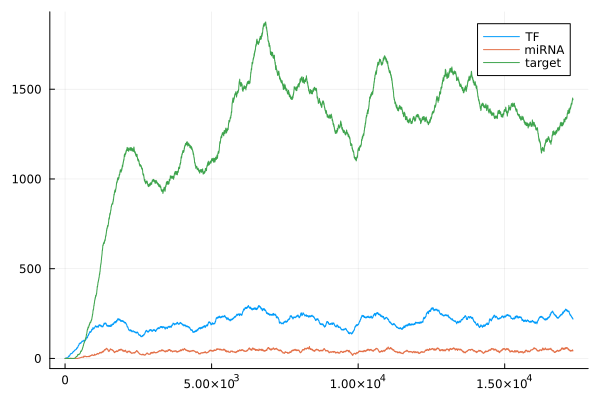

In [13]:

plot(time_steps, TF_traj, legend=:topright, label="TF")
plot!(time_steps, miRNA_traj, label="miRNA")
plot!(time_steps, target_traj, label="target") |> display
#plot!(time_steps, mRNA_1_traj, label="mRNA1")
#plot!(time_steps, mRNA_2_traj, label="mRNA2")

#savefig("feedback_trajectorie.png")



Starting... 100%|████████████████████████████████████████| Time: 0:09:45


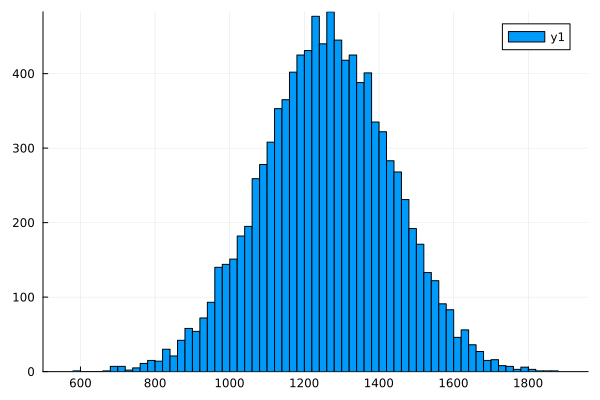

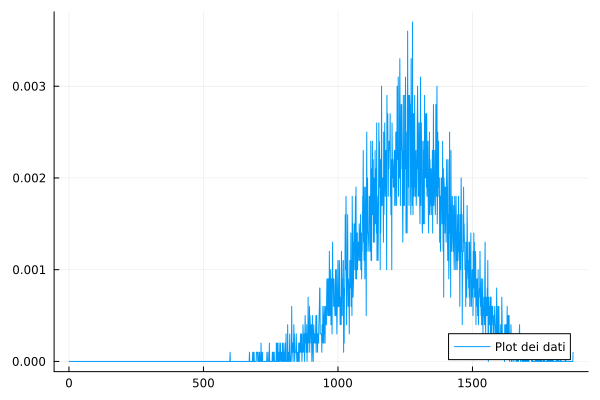

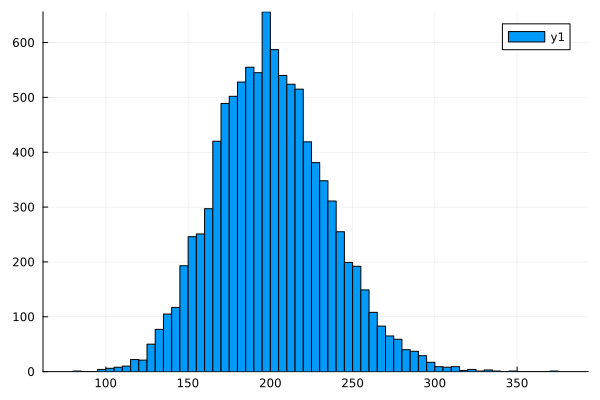

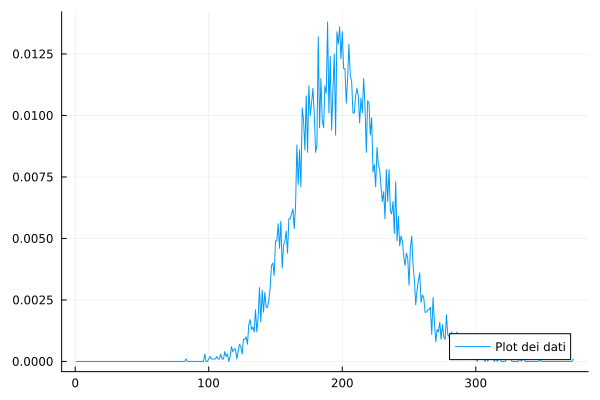

In [4]:
t_f = 20 * log(2) / g_p
Nsim = 10000
p = Progress(Nsim, 1, "Starting...");
TF_av = zeros(Nsim)
target_av = zeros(Nsim)
miRNA_av = zeros(Nsim)
for i in 1:Nsim
    res = ssa(x0,F,nu,parms,t_f)
    TF_traj = res.data[:,2]
    miRNA_traj = res.data[:,3]
    target_traj = res.data[:,5]
    TF_av[i] = TF_traj[end]
    target_av[i] = target_traj[end]
    miRNA_av[i] = miRNA_traj[end]
    next!(p)
end


TF_av = Int.(TF_av)
count_TF= zeros(maximum(TF_av)+1)
for i in 1:length(TF_av)
    count_TF[TF_av[i] + 1] += 1; 
end
count_TF ./= sum(count_TF)

target_av = Int.(target_av)
count_target= zeros(maximum(target_av)+1)
for i in 1:length(target_av)
    count_target[target_av[i] + 1] += 1; 
end
count_target ./= sum(count_target)

histogram(target_av) |> display
plot(count_target, label="Plot dei dati", legend=:bottomright) |> display

histogram(TF_av) |> display
plot(count_TF, label="Plot dei dati", legend=:bottomright) |> display

In [19]:
me_TF = mean(TF_av)
var_TF = std(TF_av)
me_target = mean(target_av)
var_target = std(target_av)
me_miRNA = mean(miRNA_av)
var_miRNA = std(miRNA_av)

9.063751710495326

In [20]:
me_target, var_target

(1255.8245, 172.44520415074888)

In [21]:
me_miRNA, var_miRNA

(41.1747, 9.063751710495326)

In [22]:
CV_TF = var_TF / me_TF
CV_target = var_target / me_target
CV_miRNA = var_miRNA / me_miRNA

CV_target

0.13731632417646644

In [23]:
kw_list = [0.24, 0.12, 0.08, 0.06, 0.04, 0.03, 0.02, 0.01]
kq_list = [0.01, 0.02, 0.03, 0.04, 0.06, 0.08, 0.12, 0.24]


8-element Vector{Float64}:
 0.01
 0.02
 0.03
 0.04
 0.06
 0.08
 0.12
 0.24

In [24]:
N_k = length(kw_list)
Nsim = 10000
t_f = 4000.0
TF_vec = zeros(Nsim)
target_vec = zeros(Nsim)
CV_TF_vec = zeros(N_k)
CV_target_vec = zeros(N_k)
p = Progress(N_k * Nsim, 1, "Starting parameter scan...");
for j in 1:N_k
    k_w = kw_list[j]
    k_q = kq_list[j]
    parms=[k_w,g_w,k_q,g_q, k_s0, h_s, g_s, k_r0, h_r, g_r, k_p0, h_p, g_p, c]
    for i in 1:Nsim
        res = ssa(x0,F,nu,parms,t_f)
        TF_traj = res.data[:,2]
        target_traj = res.data[:,5]
        TF_vec[i] = TF_traj[end]
        target_vec[i] = target_traj[end]
        next!(p)
    end
    me_TF = mean(TF_vec)
    me_target = mean(target_vec)
    std_TF = std(TF_vec)
    std_target = std(target_vec)
    CV_TF_vec[j] = std_TF / me_TF
    CV_target_vec[j] = std_target / me_target
    println("Simulazione $j completata")
end
    

Starting parameter scan...  12%|███▏                     |  ETA: 0:35:49

Simulazione 1 completata


Starting parameter scan...  25%|██████▎                  |  ETA: 0:30:00

Simulazione 2 completata


Starting parameter scan...  37%|█████████▍               |  ETA: 0:25:41

Simulazione 3 completata


Starting parameter scan...  50%|████████████▌            |  ETA: 0:20:23

Simulazione 4 completata


Starting parameter scan...  62%|███████████████▋         |  ETA: 0:15:07

Simulazione 5 completata


Starting parameter scan...  75%|██████████████████▊      |  ETA: 0:09:57

Simulazione 6 completata


Starting parameter scan...  87%|█████████████████████▉   |  ETA: 0:04:56

Simulazione 7 completata


Starting parameter scan... 100%|█████████████████████████| Time: 0:38:53


Simulazione 8 completata


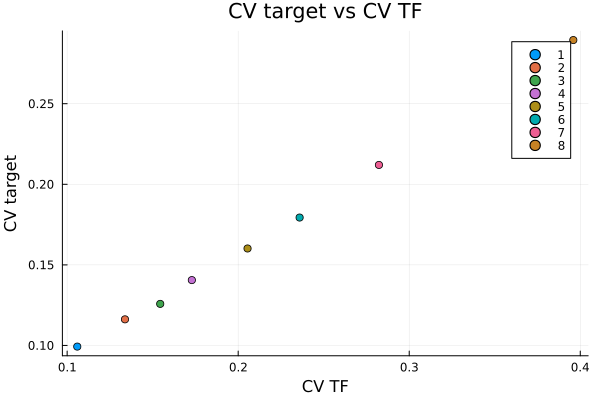

In [27]:
scatter(CV_TF_vec, CV_target_vec, group=1:N_k, legend=:topright, xlabel="CV TF", ylabel="CV target", title="CV target vs CV TF")

In [28]:
@show CV_TF_vec
@show CV_target_vec

CV_TF_vec = [0.10591799959561832, 0.13381734420070773, 0.15441998728737338, 0.17290291324873552, 0.20547177146913392, 0.23591754003327786, 0.28229375184630456, 0.39593505183875743]
CV_target_vec = [0.0992827220514687, 0.11619618140527394, 0.12579645445190568, 0.14055047790115813, 0.16016827655867252, 0.17936454218601589, 0.21201121665615566, 0.28950525389058895]


8-element Vector{Float64}:
 0.0992827220514687
 0.11619618140527394
 0.12579645445190568
 0.14055047790115813
 0.16016827655867252
 0.17936454218601589
 0.21201121665615566
 0.28950525389058895

In [ ]:
CV_TF_vec = [0.10591799959561832, 0.13381734420070773, 0.15441998728737338, 0.17290291324873552, 0.20547177146913392, 0.23591754003327786, 0.28229375184630456, 0.39593505183875743]
CV_target_vec = [0.0992827220514687, 0.11619618140527394, 0.12579645445190568, 0.14055047790115813, 0.16016827655867252, 0.17936454218601589, 0.21201121665615566, 0.28950525389058895]
cor(CV_TF_vec, CV_target_vec)

0.9994089700554488